In [1]:
# import the MNIST Data
import tensorflow as tf
import numpy as np
import sys, os,cv2
from sklearn.utils import shuffle
from scipy.misc import imread,imresize
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from skimage.transform import resize
from imgaug import augmenters as iaa
import imgaug as ia
from scipy.ndimage import zoom
import seaborn as sns
from scipy import linalg as LA

np.random.seed(0)
np.set_printoptions(precision = 3,suppress =True)
old_v = tf.logging.get_verbosity()
tf.logging.set_verbosity(tf.logging.ERROR)
from tensorflow.examples.tutorials.mnist import input_data

In [6]:
# get some of the STL data set
# Get the certain STL 10 Data
from skimage import util 
import warnings
warnings.filterwarnings("ignore")

def showimages(x,coloums=30,row=3,col=False):
    fig=plt.figure(figsize=(30, 3))
    columns = coloums; rows = row
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        if col: plt.imshow(np.squeeze(x[i-1]))
        else:   plt.imshow(np.squeeze(x[i-1]),cmap='gray')
        plt.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
        plt.grid(False)
    plt.show()

data_location = "../../../../Dataset/STL10/img/2/"
train_data = []  # create an empty list
for dirName, subdirList, fileList in sorted(os.walk(data_location)):
    for filename in fileList:
        if ".png" in filename.lower() :
            train_data.append(os.path.join(dirName,filename))

image_resize_px = 64
train_batch = np.zeros(shape=(len(train_data),image_resize_px,image_resize_px,3))
for file_index in range(len(train_data)):
    train_batch[file_index] = resize(imread(train_data[file_index]),(image_resize_px,image_resize_px))

# print out the data shape and the max and min value
print('Train batch, min, max : ',train_batch.shape,train_batch.min((0,1,2)),train_batch.max((0,1,2)))

train_batch_bird = train_batch.copy()

data_location = "../../../../Dataset/STL10/img/3/"
train_data = []  # create an empty list
for dirName, subdirList, fileList in sorted(os.walk(data_location)):
    for filename in fileList:
        if ".png" in filename.lower() :
            train_data.append(os.path.join(dirName,filename))

image_resize_px = 64
train_batch = np.zeros(shape=(len(train_data),image_resize_px,image_resize_px,3))
for file_index in range(len(train_data)):
    train_batch[file_index] = resize(imread(train_data[file_index]),(image_resize_px,image_resize_px))

# print out the data shape and the max and min value
print('Train batch, min, max : ',train_batch.shape,train_batch.min((0,1,2)),train_batch.max((0,1,2)))

train_batch_not_bird = train_batch.copy()

Train batch, min, max :  (500, 64, 64, 3) [0. 0. 0.] [1. 1. 1.]
Train batch, min, max :  (500, 64, 64, 3) [0. 0. 0.] [1. 1. 1.]


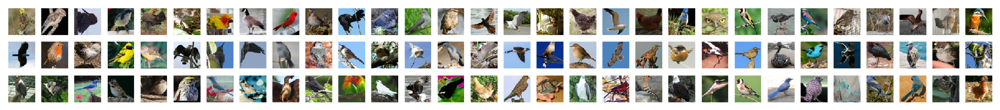

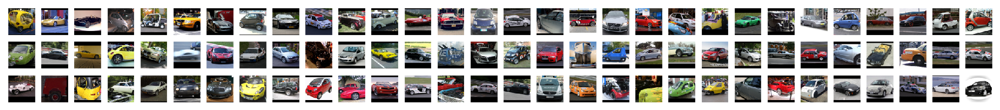

In [10]:
# show each class of images
showimages(train_batch_bird[:90,:,:,:],coloums=30,row=3)
showimages(train_batch_not_bird[:90,:,:,:],coloums=30,row=3)

# function for drawing cov matrix
def draw_cov_mat(data):
    temp           = data.reshape((data.shape[0],-1))
    temp_cen       = temp - temp.mean(1)[:,None]
    covariance_mat = temp_cen @ temp_cen.T / (temp.shape[1])
    temp_cen_std   = temp_cen / temp_cen.std(1)[:,None]
    correlation_mat= temp_cen_std @ temp_cen_std.T / (temp_cen_std.shape[1])

    sns.set(font_scale=1.)
    plt.figure(figsize=(20,5))
    plt.subplot(141); sns.heatmap(covariance_mat);               plt.title('My Covariance Matrix',fontsize=30);
    plt.subplot(142); sns.heatmap(correlation_mat,vmin=-0.5);    plt.title('My Correlation Matrix',fontsize=30);
    plt.subplot(143); sns.heatmap(np.cov(temp));                 plt.title('Numpy Covariance Matrix',fontsize=30);
    plt.subplot(144); sns.heatmap(np.corrcoef(temp),vmin=-0.5 ); plt.title('Numpy Correlation Matrix',fontsize=30);
    plt.show()

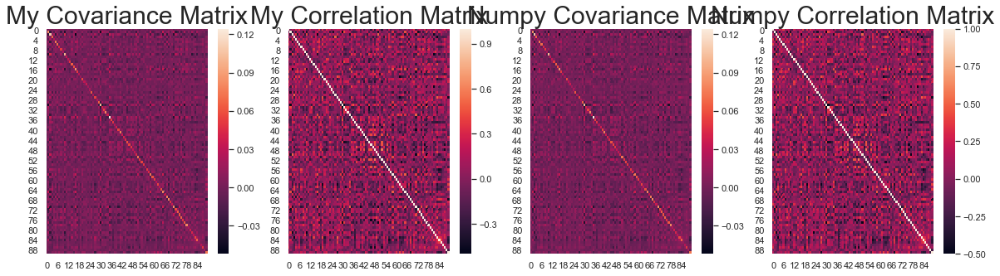

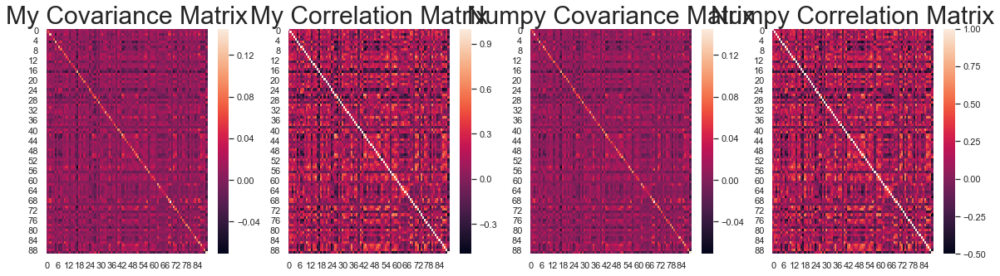

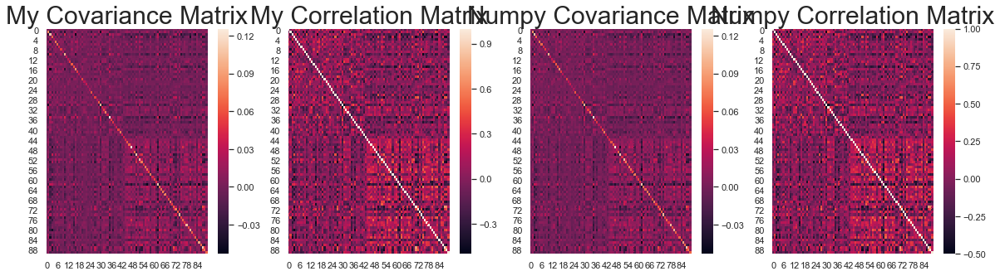

In [11]:
draw_cov_mat(train_batch_bird[:90]);draw_cov_mat(train_batch_not_bird[:90]);draw_cov_mat(np.vstack((train_batch_bird[:45],train_batch_not_bird[:45])))

In [12]:
# define the tf layers
def tf_tanh(x):      return tf.nn.tanh(x)
def d_tf_tanh(x):    return 1 - tf_tanh(x) ** 2
def tf_elu(x):       return tf.nn.elu(x)
def d_tf_elu(x):     return tf.cast(tf.greater_equal(x,0),tf.float64)  + (tf_elu(tf.cast(tf.less(x,0),tf.float64) * x) + 1.0)
def tf_relu(x):      return tf.nn.relu(x)
def d_tf_relu(x):    return tf.cast(tf.greater_equal(x,0),tf.float64)
def tf_logcosh(x):   return tf.log(tf.cosh(x))
def d_tf_logcosh(x): return tf.tanh(x)
def tf_sigmoid(x):   return tf.nn.sigmoid(x)
def d_tf_sigmoid(x): return tf_sigmoid(x) * (1.0-tf_sigmoid(x))

def tf_exp(x):  
    one  = tf.exp( -( tf.square(x))/2)
    return x * one
def d_tf_exp(x):
    one  = tf.exp( -( tf.square(x))/2)
    two  = (1-tf.square(x)) * one
    return two

class CNN():

    def __init__(self,k,inc,out,stddev=0.5,which_reg=0.0,act=tf_elu,d_act=d_tf_elu):
        self.w = tf.Variable(tf.random_normal([k,k,inc,out],stddev=stddev,seed=2,dtype=tf.float64))
        self.m,self.v = tf.Variable(tf.zeros_like(self.w)),tf.Variable(tf.zeros_like(self.w))
        self.act,self.d_act = act,d_act
        self.which_reg = which_reg

    def getw(self): return self.w

    def feedforward(self,input,stride=1,padding='VALID'):
        self.input  = input
        self.layer  = tf.nn.conv2d(input,self.w,strides=[1,stride,stride,1],padding=padding)
        self.layerA = self.act(self.layer)
        return self.layerA

    def backprop(self,gradient,stride=1,padding='VALID'):
        grad_part_1 = gradient
        grad_part_2 = self.d_act(self.layer)
        grad_part_3 = self.input

        grad_middle = grad_part_1 * grad_part_2
        grad = tf.nn.conv2d_backprop_filter(input = grad_part_3,filter_sizes = self.w.shape,out_backprop = grad_middle,
            strides=[1,stride,stride,1],padding=padding
        ) / batch_size
        grad_pass = tf.nn.conv2d_backprop_input(input_sizes = [batch_size] + list(grad_part_3.shape[1:]),filter= self.w,out_backprop = grad_middle,
            strides=[1,stride,stride,1],padding=padding
        )

        if self.which_reg == 0:
            grad = grad

        if self.which_reg == 0.5:
            grad = grad + lamda * (tf.sqrt(tf.abs(self.w))) * (1.0/tf.sqrt(tf.abs(self.w)+ 10e-5)) * tf.sign(self.w)

        if self.which_reg == 1:
            grad = grad + lamda * tf.sign(self.w)

        if self.which_reg == 1.5:
            grad = grad + lamda * 1.0/(tf.sqrt(tf.square(self.w) + 10e-5)) * self.w

        if self.which_reg == 2:
            grad = grad + lamda * (1.0/tf.sqrt(tf.square(tf.abs(self.w))+ 10e-5)) * tf.abs(self.w) * tf.sign(self.w)

        if self.which_reg == 2.5:
            grad = grad + lamda * 2.0 * self.w

        if self.which_reg == 3:
            grad = grad + lamda * tf.pow(tf.pow(tf.abs(self.w),3)+ 10e-5,-0.66) * tf.pow(tf.abs(self.w),2) * tf.sign(self.w)

        if self.which_reg == 4:
            grad = grad + lamda * tf.pow(tf.pow(tf.abs(self.w),4)+ 10e-5,-0.75) * tf.pow(tf.abs(self.w),3) * tf.sign(self.w)

        update_w = []
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1)
        v_hat = self.v / (1-beta2)
        adam_middel = learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,tf.multiply(adam_middel,m_hat)  )))
        return grad_pass,update_w
    
class FastICA_Layer():

    def __init__(self,inc,outc,act,d_act):
        self.w = tf.Variable(self.sym_decorrelation(tf.random_normal(shape=[inc,outc],stddev=1.0,dtype=tf.float64,seed=2)))
        self.m = tf.Variable(tf.zeros_like(self.w)) ; self.v = tf.Variable(tf.zeros_like(self.w))
        self.act = act; self.d_act = d_act
    
    def sym_decorrelation(self,matrix):
        s, u = tf.linalg.eigh(tf.matmul(matrix,tf.transpose(matrix)))
        decor_matrx = tf.matmul(tf.matmul(u * (1.0/tf.sqrt(s)),tf.transpose(u)),matrix)
        return decor_matrx
    
    def getw(self): return self.w
    
    def feedforward(self,input):
        self.input = input
        self.layer = tf.matmul(self.w,input)
        return self.layer

    def backprop_ica(self):
        self.layerA  = self.act(tf.matmul(self.w,self.input))
        self.layerDA = tf.reduce_mean(self.d_act(tf.matmul(self.w,self.input)),-1)
        grad_pass    = tf.matmul(tf.transpose(self.w),self.d_act(self.layer)) 
        grad = tf.matmul(self.layerA,tf.transpose(self.input)) / self.input.shape[1].value - self.layerDA[tf.newaxis,:] * self.w
        grad = self.sym_decorrelation(grad) 
        grad_w_score = grad
 
        update_w = []
        # ==== Correct Method of Weight Update ====
        #update_w.append(tf.assign(self.w,grad))

        # ==== Wrong (Adam) Method of Weight Update ====
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1)
        v_hat = self.v / (1-beta2)
        adam_middle = m_hat  *learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,adam_middle ))) 
        
        return grad_w_score,grad_pass,update_w
    
class zca_whiten_layer():

    def __init__(self): pass

    def feedforward(self,input,EPS=10e-5):
        self.input = input
        self.sigma = tf.matmul(tf.transpose(input),input) / input.shape[0].value
        self.eigenval,self.eigvector = tf.linalg.eigh(self.sigma)
        self.U = tf.matmul(tf.matmul(self.eigvector,tf.diag(1./ tf.sqrt(self.eigenval+EPS))),tf.transpose(self.eigvector))
        self.whiten = tf.matmul(input,self.U)
        return self.whiten

    def backprop(self,grad,EPS=10e-5):
        d_U = tf.matmul(tf.transpose(self.input),grad)
        
        # d_eig_value = self.eigvector.T.dot(d_U).dot(self.eigvector) * (-0.5) * np.diag(1. / (self.eigenval+EPS) ** 1.5)
        d_eig_value = tf.matmul(tf.matmul(tf.transpose(self.eigvector),d_U),self.eigvector) * (-0.5) * tf.diag(1./(self.eigenval+EPS) ** 1.5 )
        
        # d_eig_vector = d_U.dot( (np.diag(1. / np.sqrt(self.eigenval+EPS)).dot(self.eigvector.T)).T  ) + (self.eigvector.dot(np.diag(1. / np.sqrt(self.eigenval+EPS)))).dot(d_U)
        d_eig_vector = tf.matmul(d_U,tf.transpose(tf.matmul( tf.diag(1./ tf.sqrt(self.eigenval+EPS)), tf.transpose(self.eigvector)))) + \
                       tf.matmul(tf.transpose(d_U),tf.matmul(self.eigvector,tf.diag(1./ tf.sqrt(self.eigenval+EPS))))

        # E = np.ones((grad.shape[1],1)).dot(np.expand_dims(self.eigenval.T,0)) - 
        #     np.expand_dims(self.eigenval,1).dot(np.ones((1,grad.shape[1])))
        E = tf.matmul(tf.ones([grad.shape[1].value,1],dtype=tf.float64),tf.transpose(self.eigenval)[tf.newaxis,:]) - \
            tf.matmul(self.eigenval[:,tf.newaxis],tf.ones([1,grad.shape[1].value],dtype=tf.float64))

        # K_matrix = 1./(E + np.eye(grad.shape[1])) - np.eye(grad.shape[1])
        K_matrix = 1.0 /( E + tf.eye(grad.shape[1].value,dtype=tf.float64)) - tf.eye(grad.shape[1].value,dtype=tf.float64)

        # np.fill_diagonal(d_eig_value,0.0)
        tf.matrix_set_diag(d_eig_value, tf.zeros(shape=(d_eig_value.shape[0].value),dtype=tf.float64) )

        # d_sigma = self.eigvector.dot(
        #             K_matrix.T * (self.eigvector.T.dot(d_eig_vector)) + d_eig_value
        #             ).dot(self.eigvector.T)
        d_sigma = tf.matmul(tf.matmul(self.eigvector,
                    tf.transpose(K_matrix) * tf.matmul(tf.transpose(self.eigvector),d_eig_vector) + d_eig_value),
                    tf.transpose(self.eigvector))

        # d_x = grad.dot(self.U.T) + (2./grad.shape[0]) * self.input.dot(d_sigma) * 2
        d_x  = tf.matmul(grad,tf.transpose(self.U)) + (2.0/grad.shape[0].value) * tf.matmul(self.input,d_sigma) * 2

        return d_x
        
class tf_mean_layer():

    def __init__(self):
        pass

    def feedforward(self,input):
        self.mean = tf.reduce_mean(input,1)
        return input-self.mean[:,tf.newaxis]

    def backprop(self,grad):
        return grad * (1 + 1.0/grad.shape[0].value)

In [ ]:
import warnings

import numpy as np
from scipy import linalg

from ..base import BaseEstimator, TransformerMixin
from ..exceptions import ConvergenceWarning
from ..externals import six
from ..externals.six import moves
from ..externals.six import string_types
from ..utils import check_array, as_float_array, check_random_state
from ..utils.validation import check_is_fitted
from ..utils.validation import FLOAT_DTYPES

__all__ = ['fastica', 'FastICA']


def _gs_decorrelation(w, W, j):
    """
    Orthonormalize w wrt the first j rows of W
    Parameters
    ----------
    w : ndarray of shape(n)
        Array to be orthogonalized
    W : ndarray of shape(p, n)
        Null space definition
    j : int < p
        The no of (from the first) rows of Null space W wrt which w is
        orthogonalized.
    Notes
    -----
    Assumes that W is orthogonal
    w changed in place
    """
    w -= np.dot(np.dot(w, W[:j].T), W[:j])
    return w


def _sym_decorrelation(W):
    """ Symmetric decorrelation
    i.e. W <- (W * W.T) ^{-1/2} * W
    """
    s, u = linalg.eigh(np.dot(W, W.T))
    # u (resp. s) contains the eigenvectors (resp. square roots of
    # the eigenvalues) of W * W.T
    return np.dot(np.dot(u * (1. / np.sqrt(s)), u.T), W)


def _ica_def(X, tol, g, fun_args, max_iter, w_init):
    """Deflationary FastICA using fun approx to neg-entropy function
    Used internally by FastICA.
    """

    n_components = w_init.shape[0]
    W = np.zeros((n_components, n_components), dtype=X.dtype)
    n_iter = []

    # j is the index of the extracted component
    for j in range(n_components):
        w = w_init[j, :].copy()
        w /= np.sqrt((w ** 2).sum())

        for i in moves.xrange(max_iter):
            gwtx, g_wtx = g(np.dot(w.T, X), fun_args)

            w1 = (X * gwtx).mean(axis=1) - g_wtx.mean() * w

            _gs_decorrelation(w1, W, j)

            w1 /= np.sqrt((w1 ** 2).sum())

            lim = np.abs(np.abs((w1 * w).sum()) - 1)
            w = w1
            if lim < tol:
                break

        n_iter.append(i + 1)
        W[j, :] = w

    return W, max(n_iter)


def _ica_par(X, tol, g, fun_args, max_iter, w_init):
    """Parallel FastICA.
    Used internally by FastICA --main loop
    """
    W = _sym_decorrelation(w_init)
    del w_init
    p_ = float(X.shape[1])
    for ii in moves.xrange(max_iter):
        gwtx, g_wtx = g(np.dot(W, X), fun_args)
        W1 = _sym_decorrelation(np.dot(gwtx, X.T) / p_
                                - g_wtx[:, np.newaxis] * W)
        del gwtx, g_wtx
        # builtin max, abs are faster than numpy counter parts.
        lim = max(abs(abs(np.diag(np.dot(W1, W.T))) - 1))
        W = W1
        if lim < tol:
            break
    else:
        warnings.warn('FastICA did not converge. Consider increasing '
                      'tolerance or the maximum number of iterations.',
                      ConvergenceWarning)

    return W, ii + 1


# Some standard non-linear functions.
# XXX: these should be optimized, as they can be a bottleneck.
def _logcosh(x, fun_args=None):
    alpha = fun_args.get('alpha', 1.0)  # comment it out?

    x *= alpha
    gx = np.tanh(x, x)  # apply the tanh inplace
    g_x = np.empty(x.shape[0])
    # XXX compute in chunks to avoid extra allocation
    for i, gx_i in enumerate(gx):  # please don't vectorize.
        g_x[i] = (alpha * (1 - gx_i ** 2)).mean()
    return gx, g_x


def _exp(x, fun_args):
    exp = np.exp(-(x ** 2) / 2)
    gx = x * exp
    g_x = (1 - x ** 2) * exp
    return gx, g_x.mean(axis=-1)


def _cube(x, fun_args): return x ** 3, (3 * x ** 2).mean(axis=-1)

def fastica(X, n_components=None, algorithm="parallel", whiten=True,
            fun="logcosh", fun_args=None, max_iter=200, tol=1e-04, w_init=None,
            random_state=None, return_X_mean=False, compute_sources=True,
            return_n_iter=False):

    random_state = check_random_state(random_state)
    fun_args = {} if fun_args is None else fun_args
    # make interface compatible with other decompositions
    # a copy is required only for non whitened data
    X = check_array(X, copy=whiten, dtype=FLOAT_DTYPES,
                    ensure_min_samples=2).T

    alpha = fun_args.get('alpha', 1.0)
    if not 1 <= alpha <= 2:
        raise ValueError('alpha must be in [1,2]')

    if fun == 'logcosh':
        g = _logcosh
    elif fun == 'exp':
        g = _exp
    elif fun == 'cube':
        g = _cube
    elif callable(fun):
        def g(x, fun_args):
            return fun(x, **fun_args)
    else:
        exc = ValueError if isinstance(fun, six.string_types) else TypeError
        raise exc("Unknown function %r;"
                  " should be one of 'logcosh', 'exp', 'cube' or callable"
                  % fun)

    n, p = X.shape

    if not whiten and n_components is not None:
        n_components = None
        warnings.warn('Ignoring n_components with whiten=False.')

    if n_components is None:
        n_components = min(n, p)
    if (n_components > min(n, p)):
        n_components = min(n, p)
        warnings.warn('n_components is too large: it will be set to %s' % n_components)

    if whiten:
        # Centering the columns (ie the variables)
        X_mean = X.mean(axis=-1)
        X -= X_mean[:, np.newaxis]

        # Whitening and preprocessing by PCA
        u, d, _ = linalg.svd(X, full_matrices=False)

        del _
        K = (u / d).T[:n_components]  # see (6.33) p.140
        del u, d
        X1 = np.dot(K, X)
        # see (13.6) p.267 Here X1 is white and data
        # in X has been projected onto a subspace by PCA
        X1 *= np.sqrt(p)
    else:
        # X must be casted to floats to avoid typing issues with numpy
        # 2.0 and the line below
        X1 = as_float_array(X, copy=False)  # copy has been taken care of

    if w_init is None:
        w_init = np.asarray(random_state.normal(size=(n_components,
                            n_components)), dtype=X1.dtype)

    else:
        w_init = np.asarray(w_init)
        if w_init.shape != (n_components, n_components):
            raise ValueError('w_init has invalid shape -- should be %(shape)s'
                             % {'shape': (n_components, n_components)})

    kwargs = {'tol': tol,
              'g': g,
              'fun_args': fun_args,
              'max_iter': max_iter,
              'w_init': w_init}

    if algorithm == 'parallel':
        W, n_iter = _ica_par(X1, **kwargs)
    elif algorithm == 'deflation':
        W, n_iter = _ica_def(X1, **kwargs)
    else:
        raise ValueError('Invalid algorithm: must be either `parallel` or'
                         ' `deflation`.')
    del X1

    if whiten:
        if compute_sources:
            S = np.dot(np.dot(W, K), X).T
        else:
            S = None
        if return_X_mean:
            if return_n_iter:
                return K, W, S, X_mean, n_iter
            else:
                return K, W, S, X_mean
        else:
            if return_n_iter:
                return K, W, S, n_iter
            else:
                return K, W, S

    else:
        if compute_sources:
            S = np.dot(W, X).T
        else:
            S = None
        if return_X_mean:
            if return_n_iter:
                return None, W, S, None, n_iter
            else:
                return None, W, S, None
        else:
            if return_n_iter:
                return None, W, S, n_iter
            else:
                return None, W, S


class FastICA(BaseEstimator, TransformerMixin):
    """FastICA: a fast algorithm for Independent Component Analysis.
    Read more in the :ref:`User Guide <ICA>`.
    Parameters
    ----------
    n_components : int, optional
        Number of components to use. If none is passed, all are used.
    algorithm : {'parallel', 'deflation'}
        Apply parallel or deflational algorithm for FastICA.
    whiten : boolean, optional
        If whiten is false, the data is already considered to be
        whitened, and no whitening is performed.
    fun : string or function, optional. Default: 'logcosh'
        The functional form of the G function used in the
        approximation to neg-entropy. Could be either 'logcosh', 'exp',
        or 'cube'.
        You can also provide your own function. It should return a tuple
        containing the value of the function, and of its derivative, in the
        point. Example:
        def my_g(x):
            return x ** 3, (3 * x ** 2).mean(axis=-1)
    fun_args : dictionary, optional
        Arguments to send to the functional form.
        If empty and if fun='logcosh', fun_args will take value
        {'alpha' : 1.0}.
    max_iter : int, optional
        Maximum number of iterations during fit.
    tol : float, optional
        Tolerance on update at each iteration.
    w_init : None of an (n_components, n_components) ndarray
        The mixing matrix to be used to initialize the algorithm.
    random_state : int, RandomState instance or None, optional (default=None)
        If int, random_state is the seed used by the random number generator;
        If RandomState instance, random_state is the random number generator;
        If None, the random number generator is the RandomState instance used
        by `np.random`.
    Attributes
    ----------
    components_ : 2D array, shape (n_components, n_features)
        The unmixing matrix.
    mixing_ : array, shape (n_features, n_components)
        The mixing matrix.
    n_iter_ : int
        If the algorithm is "deflation", n_iter is the
        maximum number of iterations run across all components. Else
        they are just the number of iterations taken to converge.
    Examples
    --------
    >>> from sklearn.datasets import load_digits
    >>> from sklearn.decomposition import FastICA
    >>> X, _ = load_digits(return_X_y=True)
    >>> transformer = FastICA(n_components=7,
    ...         random_state=0)
    >>> X_transformed = transformer.fit_transform(X)
    >>> X_transformed.shape
    (1797, 7)
    Notes
    -----
    Implementation based on
    `A. Hyvarinen and E. Oja, Independent Component Analysis:
    Algorithms and Applications, Neural Networks, 13(4-5), 2000,
    pp. 411-430`
    """
    def __init__(self, n_components=None, algorithm='parallel', whiten=True,
                 fun='logcosh', fun_args=None, max_iter=200, tol=1e-4,
                 w_init=None, random_state=None):
        super(FastICA, self).__init__()
        if max_iter < 1:
            raise ValueError("max_iter should be greater than 1, got "
                             "(max_iter={})".format(max_iter))
        self.n_components = n_components
        self.algorithm = algorithm
        self.whiten = whiten
        self.fun = fun
        self.fun_args = fun_args
        self.max_iter = max_iter
        self.tol = tol
        self.w_init = w_init
        self.random_state = random_state

    def _fit(self, X, compute_sources=False):
        """Fit the model
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
            Training data, where n_samples is the number of samples
            and n_features is the number of features.
        compute_sources : bool
            If False, sources are not computes but only the rotation matrix.
            This can save memory when working with big data. Defaults to False.
        Returns
        -------
            X_new : array-like, shape (n_samples, n_components)
        """
        fun_args = {} if self.fun_args is None else self.fun_args
        whitening, unmixing, sources, X_mean, self.n_iter_ = fastica(
            X=X, n_components=self.n_components, algorithm=self.algorithm,
            whiten=self.whiten, fun=self.fun, fun_args=fun_args,
            max_iter=self.max_iter, tol=self.tol, w_init=self.w_init,
            random_state=self.random_state, return_X_mean=True,
            compute_sources=compute_sources, return_n_iter=True)

        if self.whiten:
            self.components_ = np.dot(unmixing, whitening)
            self.mean_ = X_mean
            self.whitening_ = whitening
        else:
            self.components_ = unmixing

        self.mixing_ = linalg.pinv(self.components_)

        if compute_sources:
            self.__sources = sources

        return sources

    def fit_transform(self, X, y=None):
        """Fit the model and recover the sources from X.
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
            Training data, where n_samples is the number of samples
            and n_features is the number of features.
        y : Ignored
        Returns
        -------
        X_new : array-like, shape (n_samples, n_components)
        """
        return self._fit(X, compute_sources=True)

    def fit(self, X, y=None):
        """Fit the model to X.
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
            Training data, where n_samples is the number of samples
            and n_features is the number of features.
        y : Ignored
        Returns
        -------
        self
        """
        self._fit(X, compute_sources=False)
        return self

    def transform(self, X, y='deprecated', copy=True):
        """Recover the sources from X (apply the unmixing matrix).
        Parameters
        ----------
        X : array-like, shape (n_samples, n_features)
            Data to transform, where n_samples is the number of samples
            and n_features is the number of features.
        y : (ignored)
            .. deprecated:: 0.19
               This parameter will be removed in 0.21.
        copy : bool (optional)
            If False, data passed to fit are overwritten. Defaults to True.
        Returns
        -------
        X_new : array-like, shape (n_samples, n_components)
        """
        if not isinstance(y, string_types) or y != 'deprecated':
            warnings.warn("The parameter y on transform() is "
                          "deprecated since 0.19 and will be removed in 0.21",
                          DeprecationWarning)

        check_is_fitted(self, 'mixing_')

        X = check_array(X, copy=copy, dtype=FLOAT_DTYPES)
        if self.whiten:
            X -= self.mean_

        return np.dot(X, self.components_.T)

    def inverse_transform(self, X, copy=True):
        """Transform the sources back to the mixed data (apply mixing matrix).
        Parameters
        ----------
        X : array-like, shape (n_samples, n_components)
            Sources, where n_samples is the number of samples
            and n_components is the number of components.
        copy : bool (optional)
            If False, data passed to fit are overwritten. Defaults to True.
        Returns
        -------
        X_new : array-like, shape (n_samples, n_features)
        """
        check_is_fitted(self, 'mixing_')

        X = check_array(X, copy=(copy and self.whiten), dtype=FLOAT_DTYPES)
        X = np.dot(X, self.mixing_.T)
        if self.whiten:
            X += self.mean_

        return X

### 1. Train a Network with only images of Bird and the final layer have channel of 1

In [13]:
# 1. Train the ICA with only Bird Images with 1 Channel At the End
num_iter = 200; learning_rate = 0.0008; batch_size = 90; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,1)

mean= tf_mean_layer(); 
zca= zca_whiten_layer(); 
ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

grad_score,grad_ica,grad_ica_up = ica.backprop_ica()
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,1])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# random_data     = shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))
random_data     = shuffle(train_batch_bird)
train_data_mini = random_data[:90,:,:,:]; print(train_data_mini.shape)

for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        sess_results = sess.run([grad_score,grad_update],feed_dict={x:current_data})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
        train_data_mini = shuffle(train_data_mini)        
    if iter % 50 == 0: print('\n---------------')


(90, 64, 64, 3)
0  : 0.0009172404275656864
---------------
50  : 0.000585767151323237942
---------------
100  : 0.00235314187686213465
---------------
150  : 0.001034697427111901657
---------------
199  : 0.001350871457993616695

(90, 56, 56, 1)
90
(90, 56, 56, 1)


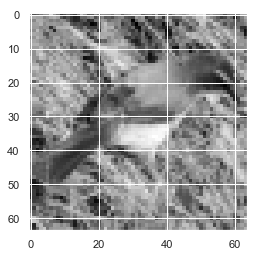

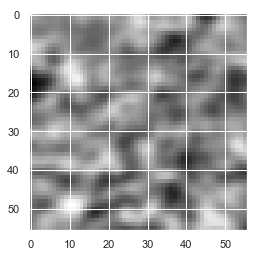

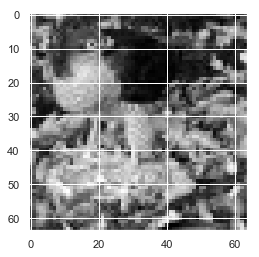

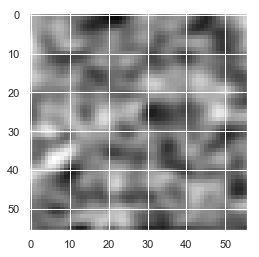

5.613177426638197


In [25]:
# view the results for batch
train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,1))
print(all_data_results.shape)
print(batch_size)
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,1))
    all_data_results = np.vstack((all_data_results,sess_results))
    
print(all_data_results.shape)

from scipy.stats import chi2_contingency
from sklearn.metrics import mutual_info_score
from skimage.filters import roberts, sobel, scharr, prewitt
def calc_MI(x, y, bins=(90*90)/4):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

plt.imshow(train_data_mini[0,:,:,0],cmap='gray')
plt.show()
plt.imshow(all_data_results[0,:,:,0],cmap='gray')
plt.show()

plt.imshow(train_data_mini[1,:,:,0],cmap='gray')
plt.show()
plt.imshow(all_data_results[1,:,:,0],cmap='gray')
plt.show()

print(
calc_MI(all_data_results[0,:,:,0].ravel(),all_data_results[1,:,:,0].ravel())
)


# all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
# # all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
# # all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
# showimages(all_data_results,coloums=10,row=1,col=False); showimages(train_data_mini ,coloums=10,row=1,col=False)

# draw_cov_mat(all_data_results)

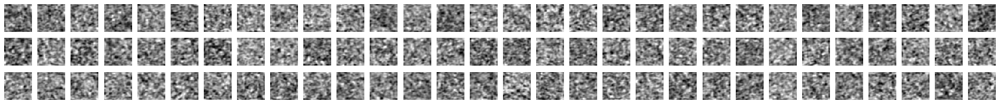

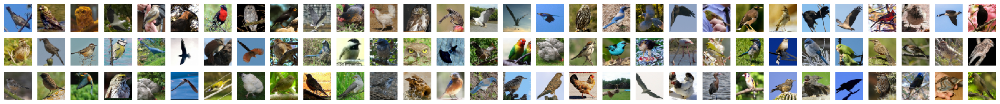

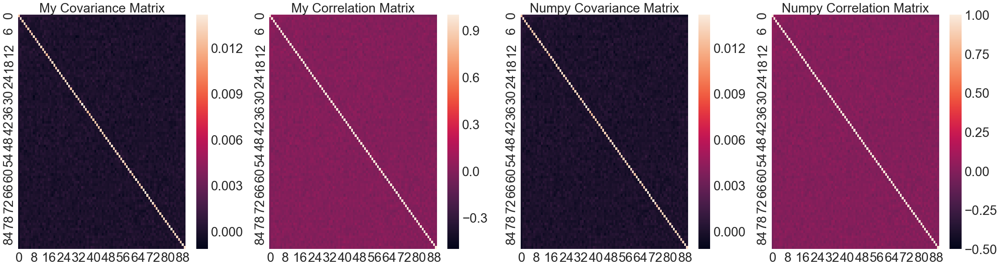

In [0]:
# Sorted View
covariance_mat  = np.corrcoef(all_data_results.reshape((all_data_results.shape[0],-1)))
sorted_index    = np.argsort(covariance_mat[0,:])[::-1]

sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]

showimages (sorted_image  [:,:,:,0],coloums=30,row=3,col=False)
showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image [:,:,:,0])

### 2. Train a network with only bird iamges but with 3 channels at the end

In [0]:
# 2. Train a network with only bird iamges but with 3 channels at the end
num_iter = 200; learning_rate = 0.0008; batch_size = 90; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,3)

mean= tf_mean_layer(); zca= zca_whiten_layer(); ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

grad_score,grad_ica,grad_ica_up = ica.backprop_ica()
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,3])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
# sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# random_data     = shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))
random_data     = shuffle(train_batch_bird)
train_data_mini = random_data[:90,:,:,:]; print(train_data_mini.shape)

for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        sess_results = sess.run([grad_score,grad_update],feed_dict={x:current_data})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
        train_data_mini = shuffle(train_data_mini)        
    if iter % 50 == 0: print('\n---------------')


(90, 64, 64, 3)
0  : 0.010779625870525852
---------------
50  : 0.010717508597047556
---------------
100  : 0.010570460900135569
---------------
150  : 0.010510337834758722
---------------
199  : 0.010487747943560565

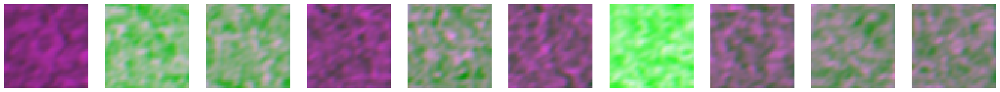

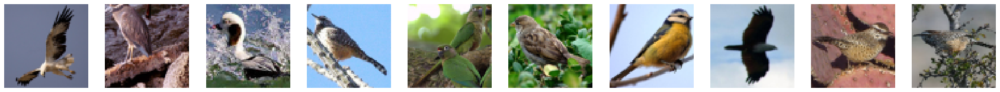

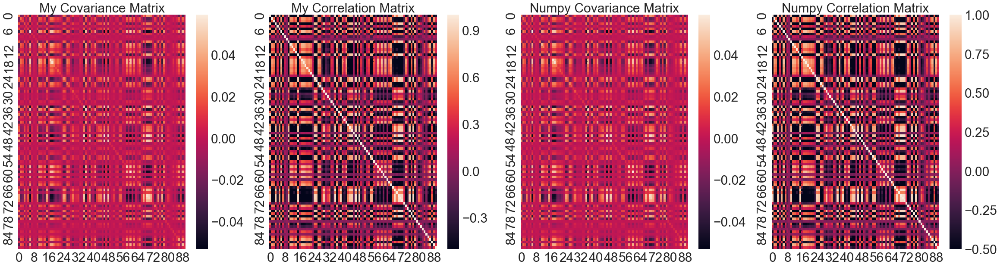

In [0]:
# view the results for batch
train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,3))
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,3))
    all_data_results = np.vstack((all_data_results,sess_results))

all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
showimages(all_data_results,coloums=10,row=1,col=True); showimages(train_data_mini ,coloums=10,row=1,col=True)
draw_cov_mat(all_data_results[:,:,:,:])

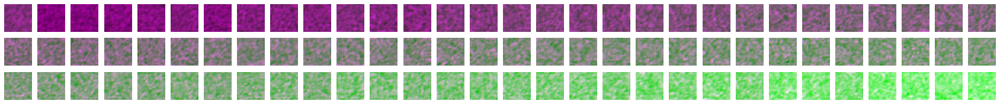

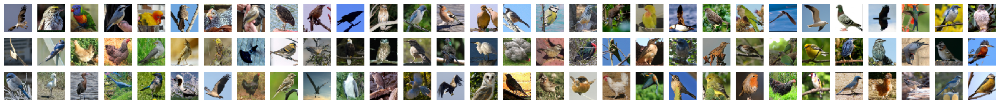

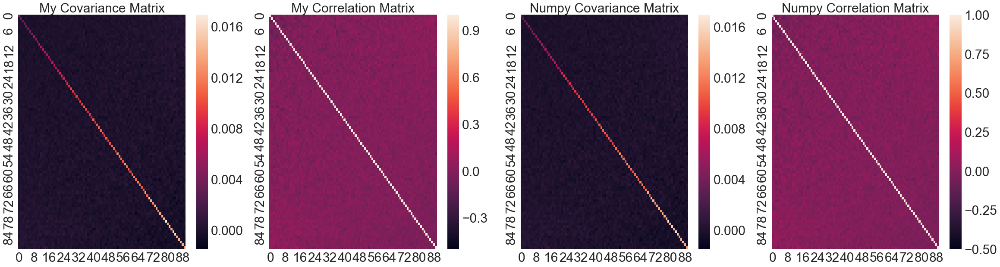

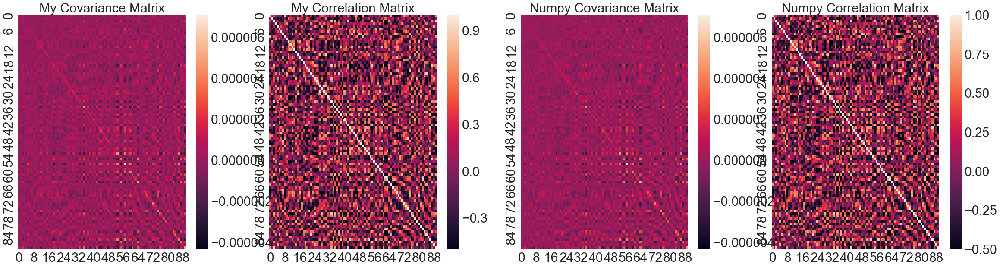

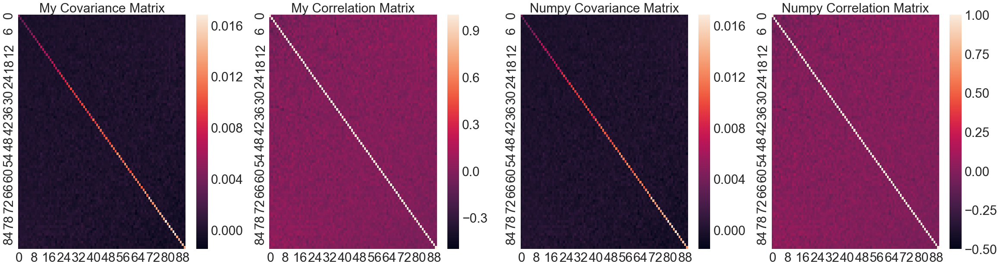

In [0]:
# Sorted View
covariance_mat  = np.corrcoef(all_data_results.reshape((all_data_results.shape[0],-1)))
sorted_index    = np.argsort(covariance_mat[0,:])[::-1]

sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]

showimages (sorted_image  [:,:,:,:],coloums=30,row=3,col=True)
showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image [:,:,:,0])
draw_cov_mat(sorted_image [:,:,:,1])
draw_cov_mat(sorted_image [:,:,:,2])

### 3. Train a Network with images of birds and Cars

In [0]:
# 1. Train the ICA with only Bird Images with 1 Channel At the End
num_iter = 200; learning_rate = 0.0008; batch_size = 90; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,1)

mean= tf_mean_layer(); zca= zca_whiten_layer(); ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

grad_score,grad_ica,grad_ica_up = ica.backprop_ica()
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,1])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
# sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

random_data     = shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))
train_data_mini = random_data[:90,:,:,:]; print(train_data_mini.shape)

for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        sess_results = sess.run([grad_score,grad_update],feed_dict={x:current_data})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
        train_data_mini = shuffle(train_data_mini)        
    if iter % 50 == 0: print('\n---------------')


(90, 64, 64, 3)
0  : 0.003467164077341936
---------------
50  : 0.0024426694452303158
---------------
100  : 0.0012602643971319266
---------------
150  : -0.00039141011435070525
---------------
199  : 0.000279548494054693555

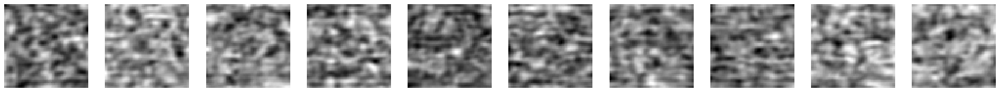

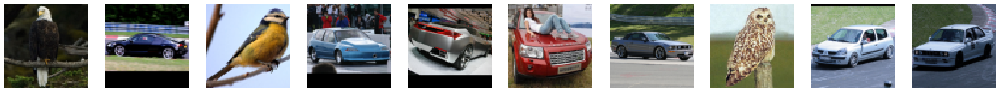

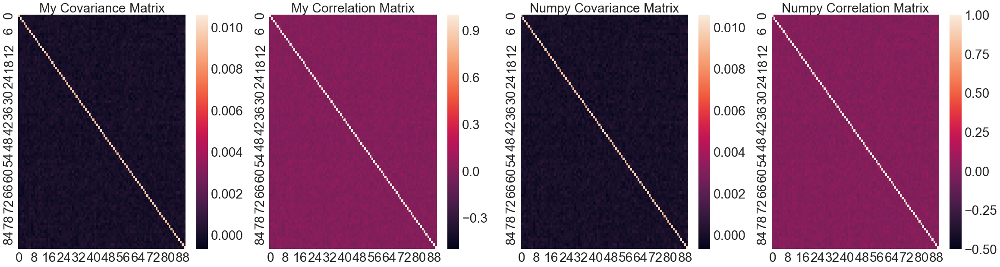

In [0]:
# view the results for batch
train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,1))
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,1))
    all_data_results = np.vstack((all_data_results,sess_results))

all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
# all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
# all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
showimages(all_data_results,coloums=10,row=1,col=False); showimages(train_data_mini ,coloums=10,row=1,col=False)

# function for drawing cov matrix
def draw_cov_mat(data):
    temp           = data.reshape((data.shape[0],-1))
    temp_cen       = temp - temp.mean(1)[:,None]
    covariance_mat = temp_cen @ temp_cen.T / (temp.shape[1])
    temp_cen_std   = temp_cen / temp_cen.std(1)[:,None]
    correlation_mat= temp_cen_std @ temp_cen_std.T / (temp_cen_std.shape[1])

    sns.set(font_scale=3.)
    plt.figure(figsize=(40,10))
    plt.subplot(141); sns.heatmap(covariance_mat);               plt.title('My Covariance Matrix',fontsize=30);
    plt.subplot(142); sns.heatmap(correlation_mat,vmin=-0.5);    plt.title('My Correlation Matrix',fontsize=30);
    plt.subplot(143); sns.heatmap(np.cov(temp));                 plt.title('Numpy Covariance Matrix',fontsize=30);
    plt.subplot(144); sns.heatmap(np.corrcoef(temp),vmin=-0.5 ); plt.title('Numpy Correlation Matrix',fontsize=30);
    plt.show()
draw_cov_mat(all_data_results)

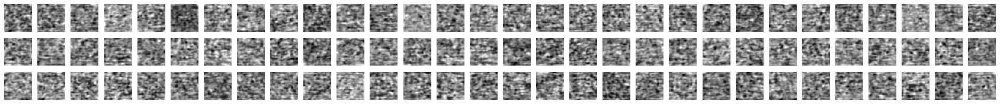

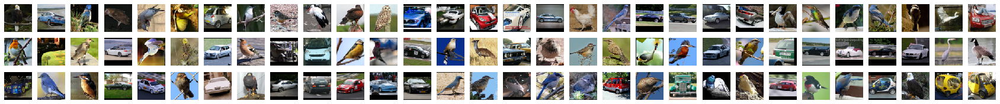

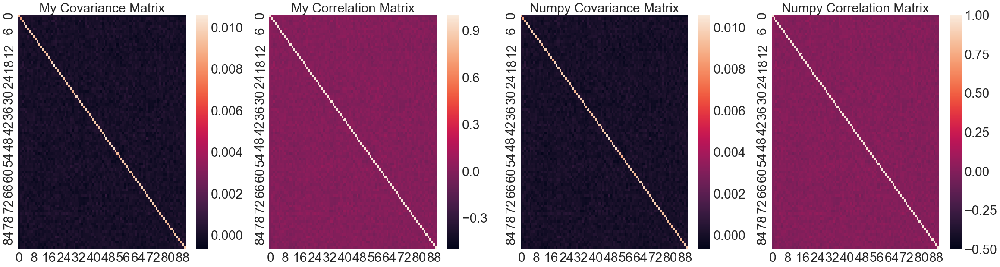

In [0]:
# Sorted View
covariance_mat  = np.corrcoef(all_data_results.reshape((all_data_results.shape[0],-1)))
sorted_index    = np.argsort(covariance_mat[0,:])[::-1]

sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]

showimages (sorted_image  [:,:,:,0],coloums=30,row=3,col=False)
showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image [:,:,:,0])

## 4. Train a Network with bird and car images with final channel of 3

In [0]:
# 4. Train a network with both bird iamges but with 3 channels at the end
num_iter = 200; learning_rate = 0.0008; batch_size = 90; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,3)

mean= tf_mean_layer(); zca= zca_whiten_layer(); ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

grad_score,grad_ica,grad_ica_up = ica.backprop_ica()
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,3])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
# sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

random_data     = shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))
train_data_mini = random_data[:90,:,:,:]; print(train_data_mini.shape)

for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        sess_results = sess.run([grad_score,grad_update],feed_dict={x:current_data})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
        train_data_mini = shuffle(train_data_mini)        
    if iter % 50 == 0: print('\n---------------')


(90, 64, 64, 3)
0  : 0.010784633060952906
---------------
50  : 0.010635990089563344
---------------
100  : 0.01050826602334469
---------------
150  : 0.010461513819877108
---------------
199  : 0.010393619330290895

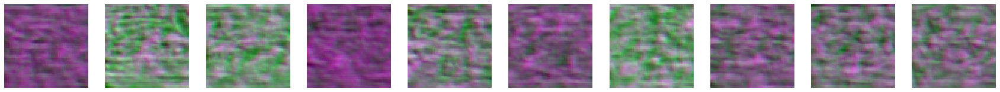

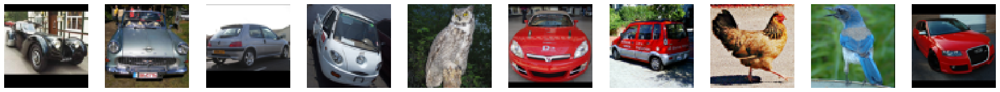

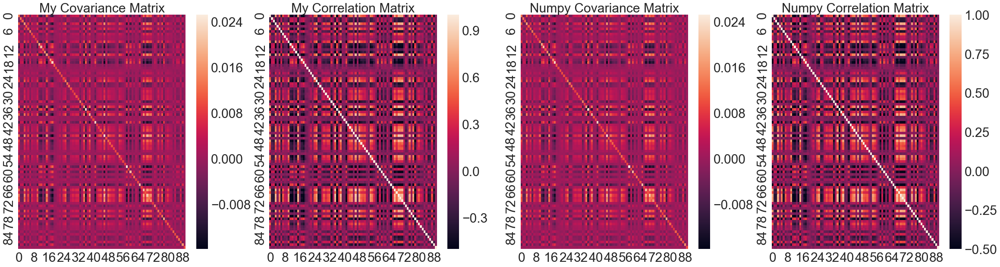

In [0]:
# view the results for batch
train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,3))
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,3))
    all_data_results = np.vstack((all_data_results,sess_results))

all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
showimages(all_data_results,coloums=30,row=3,col=True); showimages(train_data_mini ,coloums=30,row=3,col=True)
draw_cov_mat(all_data_results[:,:,:,:])

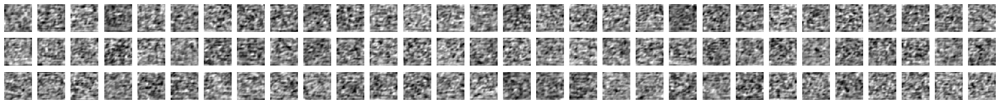

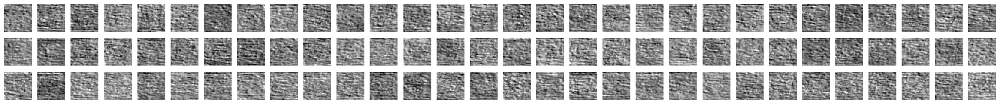

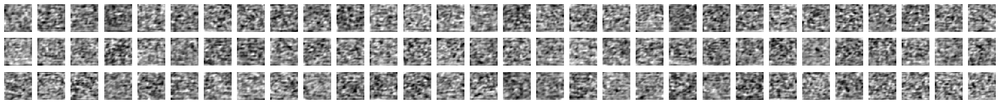

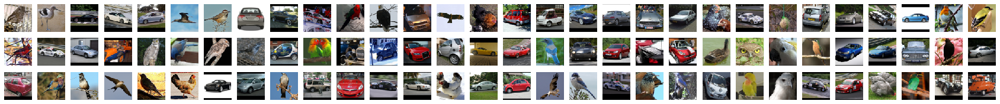

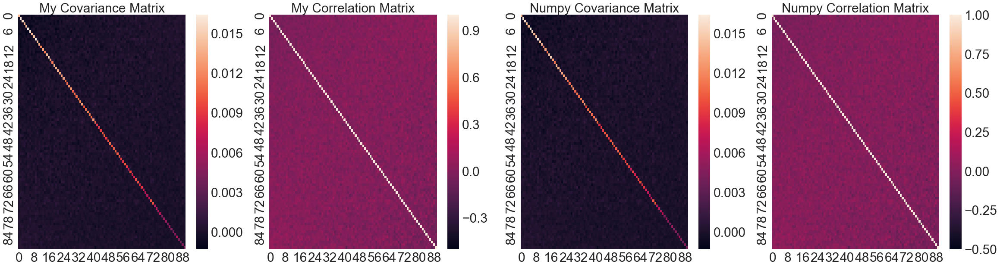

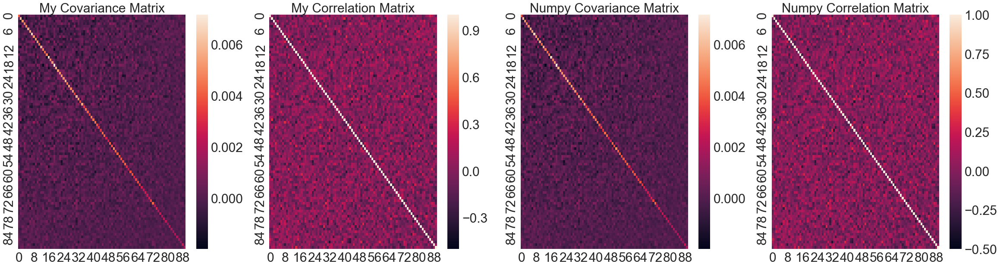

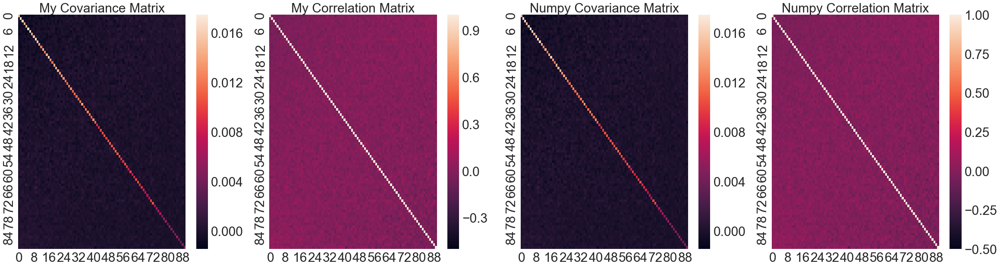

In [0]:
# Sorted View
covariance_mat  = np.cov(all_data_results.reshape((all_data_results.shape[0],-1)))
sorted_index    = np.argsort(covariance_mat[0,:])

sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]

showimages (sorted_image  [:,:,:,:],coloums=30,row=3,col=True)
showimages (sorted_image  [:,:,:,0],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,1],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,2],coloums=30,row=3,col=False)

showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image [:,:,:,0]);draw_cov_mat(sorted_image [:,:,:,1]);draw_cov_mat(sorted_image [:,:,:,2])

## 5. Train with both bird and card but with Half  batch size

In [0]:
# 4. Train a network with both bird iamges but with 3 channels at the end
num_iter = 400; learning_rate = 0.0008; batch_size = 45; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,3)

mean= tf_mean_layer(); zca= zca_whiten_layer(); ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

grad_score,grad_ica,grad_ica_up = ica.backprop_ica()
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,3])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
# sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

random_data     = shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))
train_data_mini = random_data[:90,:,:,:]; print(train_data_mini.shape)

for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        sess_results = sess.run([grad_score,grad_update],feed_dict={x:current_data})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
    train_data_mini = shuffle(train_data_mini)        
    if iter % 50 == 0: print('\n---------------')


(90, 64, 64, 3)
0  : 0.02150956519259062
---------------
50  : 0.021251368468260066
---------------
100  : 0.020801422562336108
---------------
150  : 0.020891214066959547
---------------
200  : 0.021076723190112223
---------------
250  : 0.020461578796601886
---------------
300  : 0.020692105135774342
---------------
350  : 0.020535919710247215
---------------
399  : 0.020746172832891315

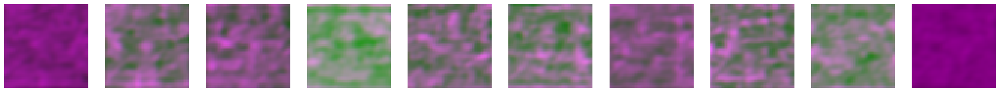

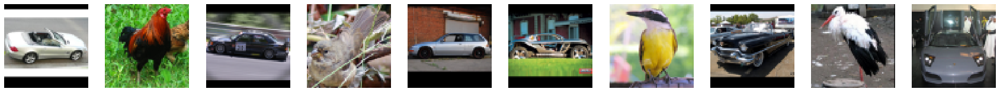

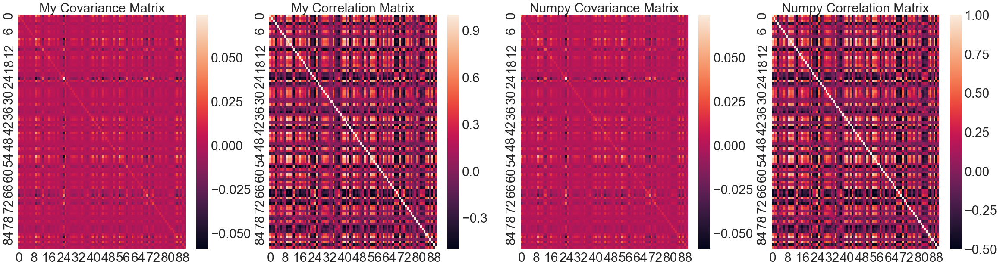

In [0]:
# view the results for batch
train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,3))
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,3))
    all_data_results = np.vstack((all_data_results,sess_results))

all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
showimages(all_data_results,coloums=30,row=3,col=True); showimages(train_data_mini ,coloums=30,row=3,col=True)
draw_cov_mat(all_data_results[:,:,:,:])

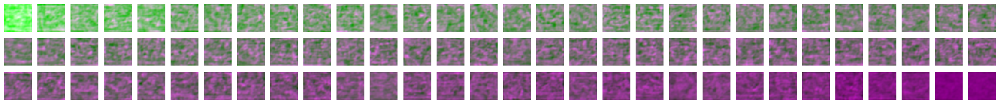

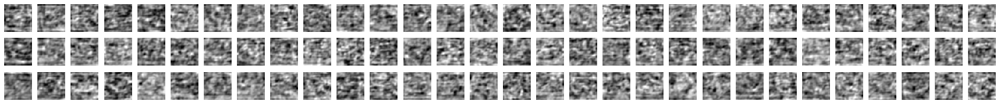

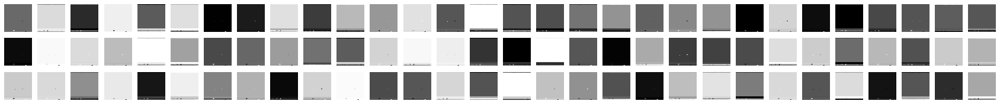

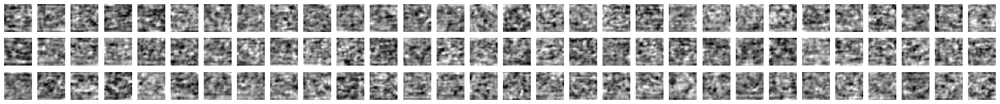

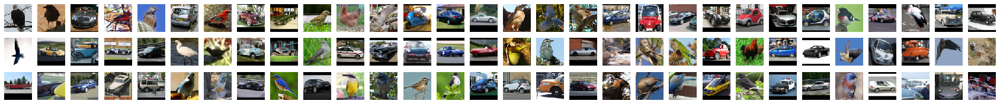

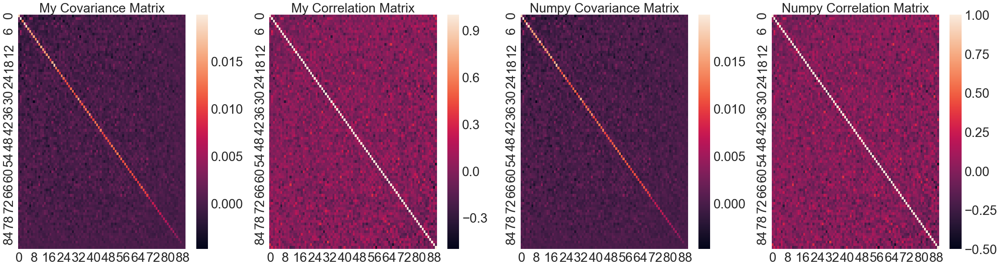

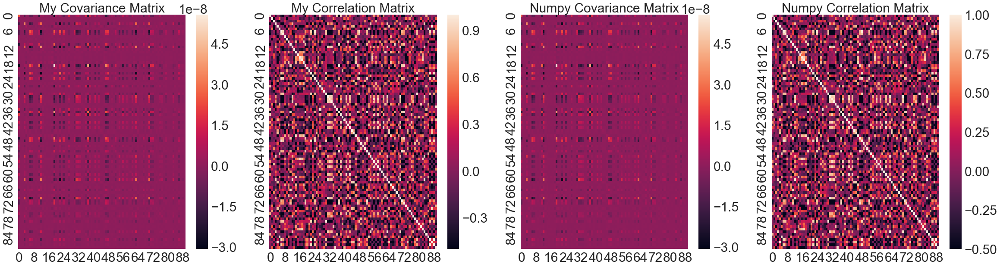

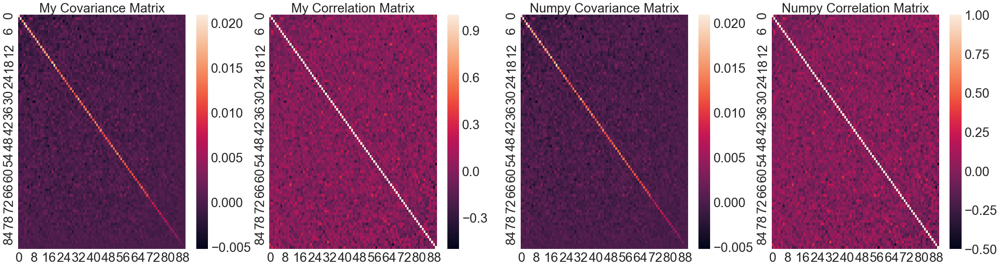

In [0]:
# Sorted View
covariance_mat  = np.corrcoef(all_data_results.reshape((90,-1)))
sorted_index    = np.argsort(covariance_mat[np.argmax(covariance_mat.std(0)),:])

sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]

showimages (sorted_image  [:,:,:,:],coloums=30,row=3,col=True)
showimages (sorted_image  [:,:,:,0],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,1],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,2],coloums=30,row=3,col=False)

showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image [:,:,:,0]);draw_cov_mat(sorted_image [:,:,:,1]);draw_cov_mat(sorted_image [:,:,:,2])

## 6. Train the Model but with 2 Batch Size 

In [0]:
# 4. Train a network with both bird iamges but with 3 channels at the end
num_iter = 400; learning_rate = 0.0008; batch_size = 2; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,3)

mean= tf_mean_layer(); zca= zca_whiten_layer(); ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

grad_score,grad_ica,grad_ica_up = ica.backprop_ica()
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,3])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
# sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

random_data     = shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))
train_data_mini = random_data[:90,:,:,:]; print(train_data_mini.shape)

for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        sess_results = sess.run([grad_score,grad_update],feed_dict={x:current_data})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
    train_data_mini = shuffle(train_data_mini)        
    if iter % 50 == 0: print('\n---------------')


(90, 64, 64, 3)
0  : 0.49667726734411237
---------------
50  : 0.498053731561978634
---------------
100  : 0.18288875711926766
---------------
150  : 0.45903041534500133
---------------
200  : 0.24694889519252794
---------------
250  : 0.46985763324418706
---------------
300  : 0.27549155790491667
---------------
350  : 0.42565920689725623
---------------
399  : 0.42303717601806587

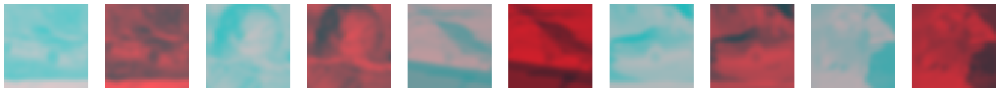

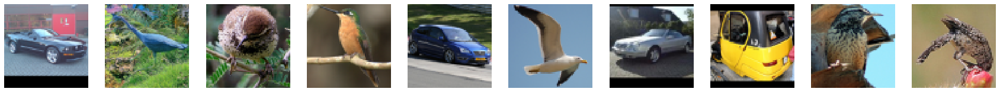

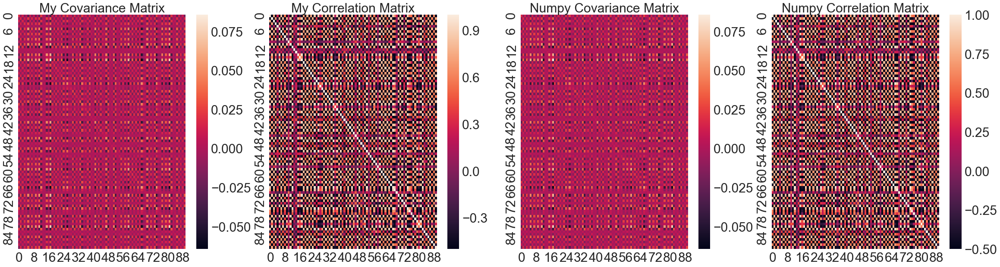

In [0]:
# view the results for batch
train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,3))
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,3))
    all_data_results = np.vstack((all_data_results,sess_results))

all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
showimages(all_data_results,coloums=30,row=3,col=True); showimages(train_data_mini ,coloums=30,row=3,col=True)
draw_cov_mat(all_data_results[:,:,:,:])

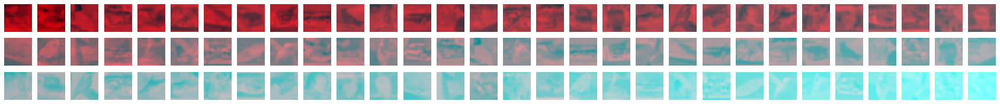

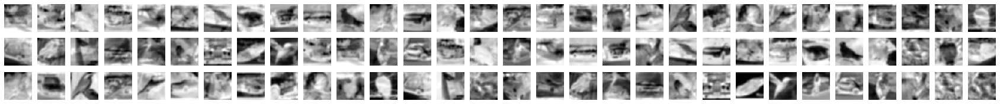

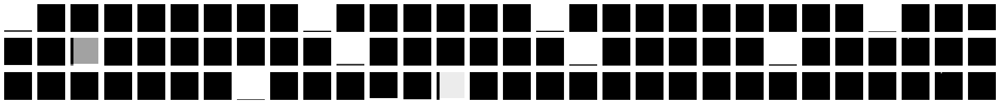

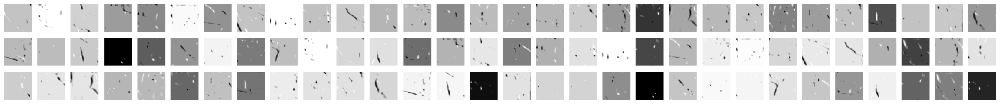

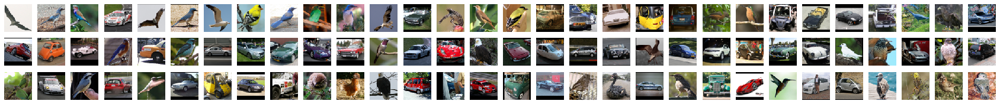

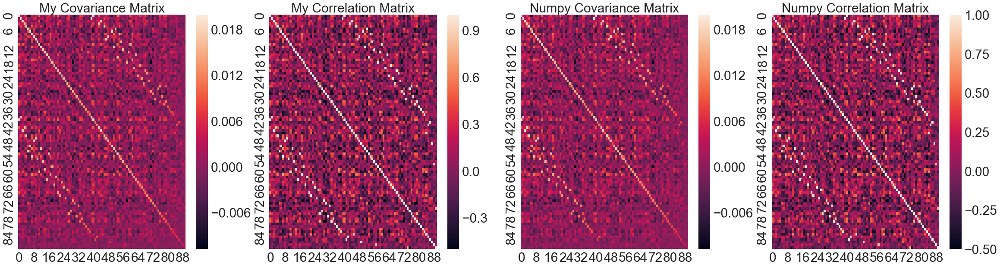

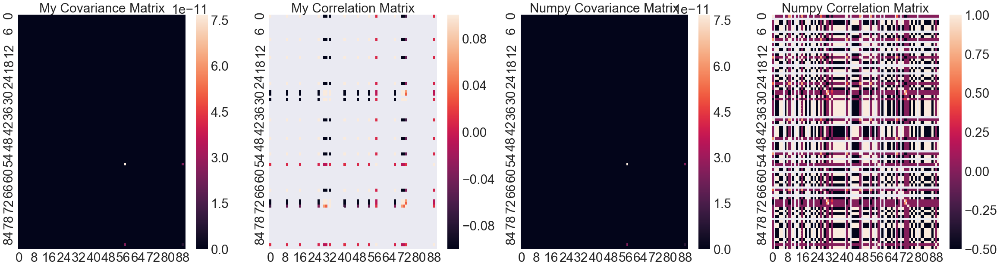

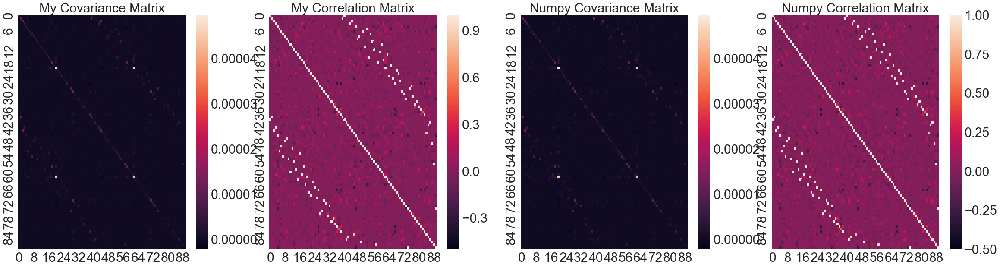

In [0]:
# Sorted View
covariance_mat  = np.corrcoef(all_data_results.reshape((90,-1)))
sorted_index    = np.argsort(covariance_mat[np.argmax(covariance_mat.std(0)),:])

sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]

showimages (sorted_image  [:,:,:,:],coloums=30,row=3,col=True)
showimages (sorted_image  [:,:,:,0],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,1],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,2],coloums=30,row=3,col=False)

showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image [:,:,:,0]);draw_cov_mat(sorted_image [:,:,:,1]);draw_cov_mat(sorted_image [:,:,:,2])

## 7. Create Labels for each image and use it with KL Divergence

In [0]:
shuffle(np.vstack((train_batch_bird,train_batch_not_bird)))

bird_labels = np.ones((train_batch_bird.shape[0],1)); car_labels  = np.zeros((train_batch_not_bird.shape[0],1))
print(bird_labels.shape,bird_labels.sum());       print(car_labels.shape ,car_labels.sum())

train_data = np.vstack((train_batch_bird[:45],train_batch_not_bird[:45]))
train_label= np.vstack((bird_labels[:45],car_labels[:45]))
print(train_data.shape,train_label.shape)

(500, 1) 500.0
(500, 1) 0.0
(90, 64, 64, 3) (90, 1)


In [0]:
# define the tf layers
def tf_tanh(x):      return tf.nn.tanh(x)
def d_tf_tanh(x):    return 1 - tf_tanh(x) ** 2
def tf_elu(x):       return tf.nn.elu(x)
def d_tf_elu(x):     return tf.cast(tf.greater_equal(x,0),tf.float64)  + (tf_elu(tf.cast(tf.less(x,0),tf.float64) * x) + 1.0)
def tf_relu(x):      return tf.nn.relu(x)
def d_tf_relu(x):    return tf.cast(tf.greater_equal(x,0),tf.float64)
def tf_logcosh(x):   return tf.log(tf.cosh(x))
def d_tf_logcosh(x): return tf.tanh(x)
def tf_sigmoid(x):   return tf.nn.sigmoid(x)
def d_tf_sigmoid(x): return tf_sigmoid(x) * (1.0-tf_sigmoid(x))

def tf_exp(x):  
    one  = tf.exp( -( tf.square(x))/2)
    return x * one
def d_tf_exp(x):
    one  = tf.exp( -( tf.square(x))/2)
    two  = (1-tf.square(x)) * one
    return two

class CNN():

    def __init__(self,k,inc,out,stddev=0.5,which_reg=0.0,act=tf_elu,d_act=d_tf_elu):
        self.w = tf.Variable(tf.random_normal([k,k,inc,out],stddev=stddev,seed=2,dtype=tf.float64))
        self.m,self.v = tf.Variable(tf.zeros_like(self.w)),tf.Variable(tf.zeros_like(self.w))
        self.act,self.d_act = act,d_act
        self.which_reg = which_reg

    def getw(self): return self.w

    def feedforward(self,input,stride=1,padding='VALID'):
        self.input  = input
        self.layer  = tf.nn.conv2d(input,self.w,strides=[1,stride,stride,1],padding=padding)
        self.layerA = self.act(self.layer)
        return self.layerA

    def backprop(self,gradient,stride=1,padding='VALID'):
        grad_part_1 = gradient
        grad_part_2 = self.d_act(self.layer)
        grad_part_3 = self.input

        grad_middle = grad_part_1 * grad_part_2
        grad = tf.nn.conv2d_backprop_filter(input = grad_part_3,filter_sizes = self.w.shape,out_backprop = grad_middle,
            strides=[1,stride,stride,1],padding=padding
        ) / batch_size
        grad_pass = tf.nn.conv2d_backprop_input(input_sizes = [batch_size] + list(grad_part_3.shape[1:]),filter= self.w,out_backprop = grad_middle,
            strides=[1,stride,stride,1],padding=padding
        )

        if self.which_reg == 0:
            grad = grad

        if self.which_reg == 0.5:
            grad = grad + lamda * (tf.sqrt(tf.abs(self.w))) * (1.0/tf.sqrt(tf.abs(self.w)+ 10e-5)) * tf.sign(self.w)

        if self.which_reg == 1:
            grad = grad + lamda * tf.sign(self.w)

        if self.which_reg == 1.5:
            grad = grad + lamda * 1.0/(tf.sqrt(tf.square(self.w) + 10e-5)) * self.w

        if self.which_reg == 2:
            grad = grad + lamda * (1.0/tf.sqrt(tf.square(tf.abs(self.w))+ 10e-5)) * tf.abs(self.w) * tf.sign(self.w)

        if self.which_reg == 2.5:
            grad = grad + lamda * 2.0 * self.w

        if self.which_reg == 3:
            grad = grad + lamda * tf.pow(tf.pow(tf.abs(self.w),3)+ 10e-5,-0.66) * tf.pow(tf.abs(self.w),2) * tf.sign(self.w)

        if self.which_reg == 4:
            grad = grad + lamda * tf.pow(tf.pow(tf.abs(self.w),4)+ 10e-5,-0.75) * tf.pow(tf.abs(self.w),3) * tf.sign(self.w)

        update_w = []
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1)
        v_hat = self.v / (1-beta2)
        adam_middel = learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,tf.multiply(adam_middel,m_hat)  )))
        return grad_pass,update_w
    
class FastICA_Layer():

    def __init__(self,inc,outc,act,d_act):
        self.w = tf.Variable(self.sym_decorrelation(tf.random_normal(shape=[inc,outc],stddev=1.0,dtype=tf.float64,seed=2)))
        self.m = tf.Variable(tf.zeros_like(self.w)) ; self.v = tf.Variable(tf.zeros_like(self.w))
        self.act = act; self.d_act = d_act
    
    def sym_decorrelation(self,matrix):
        s, u = tf.linalg.eigh(tf.matmul(matrix,tf.transpose(matrix)))
        decor_matrx = tf.matmul(tf.matmul(u * (1.0/tf.sqrt(s)),tf.transpose(u)),matrix)
        return decor_matrx
    def getw(self): return self.w
    def feedforward(self,input):
        self.input = input
        self.layer = tf.matmul(self.w,input)
        return self.layer

    def backprop_ica(self,grad_out):
        self.layerA  = self.act(tf.matmul(self.w,self.input)) 
        self.layerDA = tf.reduce_mean(self.d_act(tf.matmul(self.w,self.input)),-1)
        grad_pass    = tf.matmul(tf.transpose(self.w),self.d_act(self.layer))  + tf.matmul(tf.transpose(self.w),grad_out) 
        grad         = tf.matmul(self.layerA,tf.transpose(self.input)) / self.input.shape[1].value - self.layerDA[tf.newaxis,:] * self.w 
        grad         = self.sym_decorrelation(grad) + tf.matmul(grad_out,tf.transpose(self.input))
        grad_w_score = grad

        update_w = []
        # ==== Correct Method of Weight Update ====
        # update_w.append(tf.assign(self.w,grad))

        # ==== Wrong (Adam) Method of Weight Update ====
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1)
        v_hat = self.v / (1-beta2)
        adam_middle = m_hat  *learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,adam_middle ))) 
        
        return grad_w_score,grad_pass,update_w
    
class zca_whiten_layer():

    def __init__(self): pass

    def feedforward(self,input,EPS=10e-5):
        self.input = input
        self.sigma = tf.matmul(tf.transpose(input),input) / input.shape[0].value
        self.eigenval,self.eigvector = tf.linalg.eigh(self.sigma)
        self.U = tf.matmul(tf.matmul(self.eigvector,tf.diag(1./ tf.sqrt(self.eigenval+EPS))),tf.transpose(self.eigvector))
        self.whiten = tf.matmul(input,self.U)
        return self.whiten

    def backprop(self,grad,EPS=10e-5):
        d_U = tf.matmul(tf.transpose(self.input),grad)
        
        # d_eig_value = self.eigvector.T.dot(d_U).dot(self.eigvector) * (-0.5) * np.diag(1. / (self.eigenval+EPS) ** 1.5)
        d_eig_value = tf.matmul(tf.matmul(tf.transpose(self.eigvector),d_U),self.eigvector) * (-0.5) * tf.diag(1./(self.eigenval+EPS) ** 1.5 )
        
        # d_eig_vector = d_U.dot( (np.diag(1. / np.sqrt(self.eigenval+EPS)).dot(self.eigvector.T)).T  ) + (self.eigvector.dot(np.diag(1. / np.sqrt(self.eigenval+EPS)))).dot(d_U)
        d_eig_vector = tf.matmul(d_U,tf.transpose(tf.matmul( tf.diag(1./ tf.sqrt(self.eigenval+EPS)), tf.transpose(self.eigvector)))) + \
                       tf.matmul(tf.transpose(d_U),tf.matmul(self.eigvector,tf.diag(1./ tf.sqrt(self.eigenval+EPS))))

        # E = np.ones((grad.shape[1],1)).dot(np.expand_dims(self.eigenval.T,0)) - 
        #     np.expand_dims(self.eigenval,1).dot(np.ones((1,grad.shape[1])))
        E = tf.matmul(tf.ones([grad.shape[1].value,1],dtype=tf.float64),tf.transpose(self.eigenval)[tf.newaxis,:]) - \
            tf.matmul(self.eigenval[:,tf.newaxis],tf.ones([1,grad.shape[1].value],dtype=tf.float64))

        # K_matrix = 1./(E + np.eye(grad.shape[1])) - np.eye(grad.shape[1])
        K_matrix = 1.0 /( E + tf.eye(grad.shape[1].value,dtype=tf.float64)) - tf.eye(grad.shape[1].value,dtype=tf.float64)

        # np.fill_diagonal(d_eig_value,0.0)
        tf.matrix_set_diag(d_eig_value, tf.zeros(shape=(d_eig_value.shape[0].value),dtype=tf.float64) )

        # d_sigma = self.eigvector.dot(
        #             K_matrix.T * (self.eigvector.T.dot(d_eig_vector)) + d_eig_value
        #             ).dot(self.eigvector.T)
        d_sigma = tf.matmul(tf.matmul(self.eigvector,
                    tf.transpose(K_matrix) * tf.matmul(tf.transpose(self.eigvector),d_eig_vector) + d_eig_value),
                    tf.transpose(self.eigvector))

        # d_x = grad.dot(self.U.T) + (2./grad.shape[0]) * self.input.dot(d_sigma) * 2
        d_x  = tf.matmul(grad,tf.transpose(self.U)) + (2.0/grad.shape[0].value) * tf.matmul(self.input,d_sigma) * 2

        return d_x
        
class tf_mean_layer():

    def __init__(self):
        pass

    def feedforward(self,input):
        self.mean = tf.reduce_mean(input,1)
        return input-self.mean[:,tf.newaxis]

    def backprop(self,grad):
        return grad * (1 + 1.0/grad.shape[0].value)

In [0]:
# 4. Train a network with both bird iamges but with 3 channels at the end
num_iter = 200; learning_rate = 0.0008; batch_size = 1 ; lamda=0.0
beta1,beta2,adam_e = 0.9,0.999,1e-8

c1 = CNN(3,3,3)
c2 = CNN(3,3,3)
c3 = CNN(3,3,3)
c4 = CNN(3,3,3)

mean= tf_mean_layer(); zca= zca_whiten_layer(); ica= FastICA_Layer(batch_size,batch_size,act=tf_logcosh,d_act=d_tf_logcosh)

# define graph
x = tf.placeholder(shape=[batch_size,64,64,3],dtype=tf.float64)
y = tf.placeholder(shape=[batch_size,1],dtype=tf.float64)
y_stacked = tf.stack((y,y,y),1)[:,:,0]

layer1 = c1.feedforward(x,     padding='VALID')
layer2 = c2.feedforward(layer1,padding='VALID')
layer3 = c3.feedforward(layer2,padding='VALID')
layer4 = c4.feedforward(layer3,padding='VALID')

final_reshape = tf.reshape(layer4,[batch_size,-1])
mean_layer    = mean.feedforward(final_reshape)
zca_layer     = tf.transpose(zca.feedforward(tf.transpose(mean_layer)))
fast_ica      = ica.feedforward(zca_layer)

fast_ica_split = tf.reshape(fast_ica,[batch_size,56,56,3])
fast_ica_mean  = tf.reduce_mean(fast_ica_split,axis=(1,2))
fast_ica_sig   = tf_sigmoid(fast_ica_mean)
kl_div         = tf.reduce_sum( y_stacked * tf.log( y_stacked/fast_ica_sig + 1e-5)  )

dkl_div =       tf.reshape(tf.tile(d_tf_sigmoid(-y_stacked/fast_ica_sig + 1e-5 )[:,None,:],[1,56*56,1]),[batch_size,9408])
grad_score,grad_ica,grad_ica_up = ica.backprop_ica(dkl_div)
grad_zca         = tf.transpose(zca.backprop(tf.transpose(grad_ica)))
grad_mean        = mean.backprop(grad_zca)
grad_zca_reshape = tf.reshape (grad_mean,[batch_size,56,56,3])

grad4,grad4_up = c4.backprop(grad_zca_reshape,padding='VALID')
grad3,grad3_up = c3.backprop(grad4,padding='VALID')
grad2,grad2_up = c2.backprop(grad3,padding='VALID')
grad1,grad1_up = c1.backprop(grad2,padding='VALID')

grad_update    = grad_ica_up + grad4_up + grad3_up + grad2_up + grad1_up

# train the model adam approach
# sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

train_data,train_label    = shuffle(train_data,train_label)
train_data_mini           = train_data [:90,:,:,:]; print(train_data_mini.shape)
train_labelmini           = train_label[:90,:];     print(train_labelmini.shape)
for iter in range(num_iter):
    for current_data_index in range(0,len(train_data_mini),batch_size):
        current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
        current_label= train_labelmini[current_data_index:current_data_index+batch_size,:]
        sess_results = sess.run([kl_div,grad_update],feed_dict={x:current_data,y:current_label})
        sys.stdout.write('\r'+str(iter) + "  : "+str(sess_results[0].mean())); sys.stdout.flush()
    train_data_mini,train_labelmini = shuffle(train_data_mini,train_labelmini)        
    if iter % 50 == 0: print('\n---------------')

(90, 64, 64, 3)
(90, 1)
0  : 2.3402752148530344
---------------
50  : 2.0863457611866377
---------------
100  : 2.0794579850433403
---------------
150  : 2.0794572914806575
---------------
199  : 0.0794583441200162

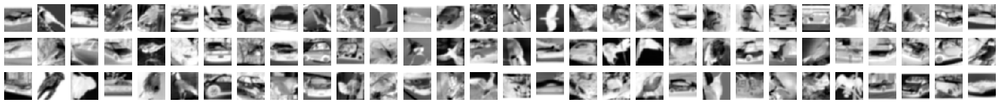

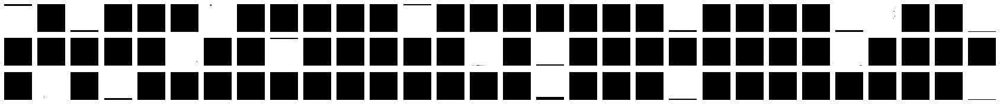

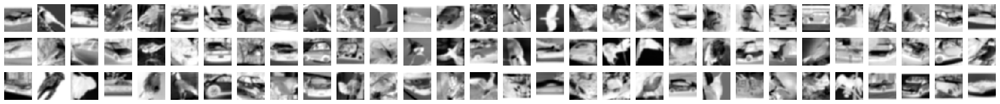

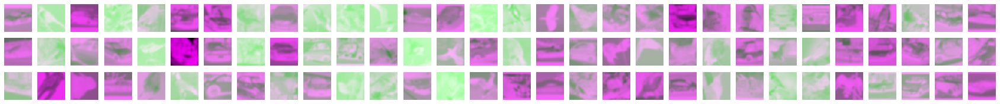

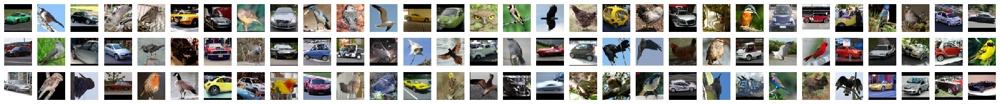

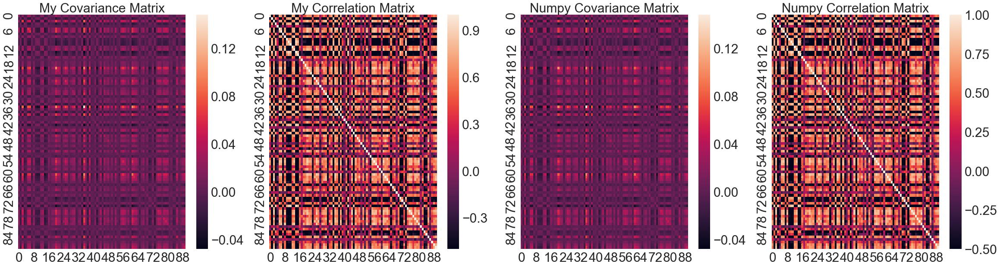

In [0]:
# view the results for batch
# train_data_mini  = shuffle(train_data_mini)
all_data_results = sess.run(fast_ica,feed_dict={x:train_data_mini[:batch_size,:,:,:] }).reshape((batch_size,56,56,3))
for current_data_index in range(batch_size,len(train_data_mini),batch_size):
    current_data = train_data_mini[current_data_index:current_data_index+batch_size,:,:,:]
    sess_results = sess.run(fast_ica,feed_dict={x:current_data}).reshape((batch_size,56,56,3))
    all_data_results = np.vstack((all_data_results,sess_results))
all_data_results[:,:,:,0]    = (all_data_results[:,:,:,0] - all_data_results[:,:,:,0].min()) /(all_data_results[:,:,:,0].max() - all_data_results[:,:,:,0].min() + 1e-8)
all_data_results[:,:,:,1]    = (all_data_results[:,:,:,1] - all_data_results[:,:,:,1].min()) /(all_data_results[:,:,:,1].max() - all_data_results[:,:,:,1].min() + 1e-8)
all_data_results[:,:,:,2]    = (all_data_results[:,:,:,2] - all_data_results[:,:,:,2].min()) /(all_data_results[:,:,:,2].max() - all_data_results[:,:,:,2].min() + 1e-8)
showimages(all_data_results[:,:,:,0],coloums=30,row=3,col=False); 
showimages(all_data_results[:,:,:,1],coloums=30,row=3,col=False); 
showimages(all_data_results[:,:,:,2],coloums=30,row=3,col=False); 
showimages  (all_data_results,coloums=30,row=3,col=True); 
showimages  (train_data_mini ,coloums=30,row=3,col=True)
draw_cov_mat(all_data_results[:,:,:,:])

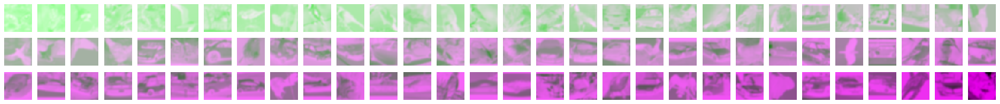

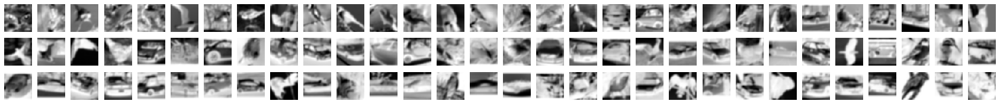

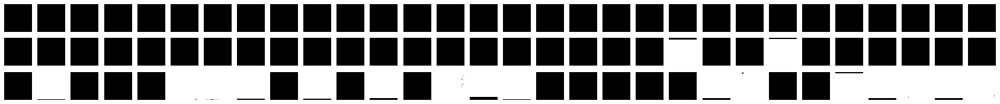

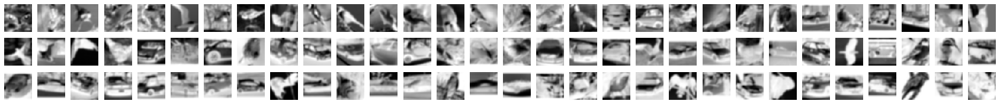

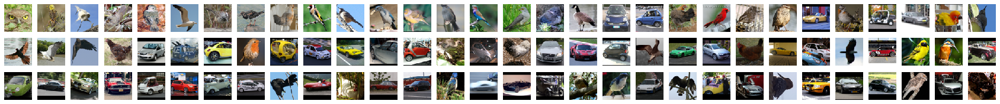

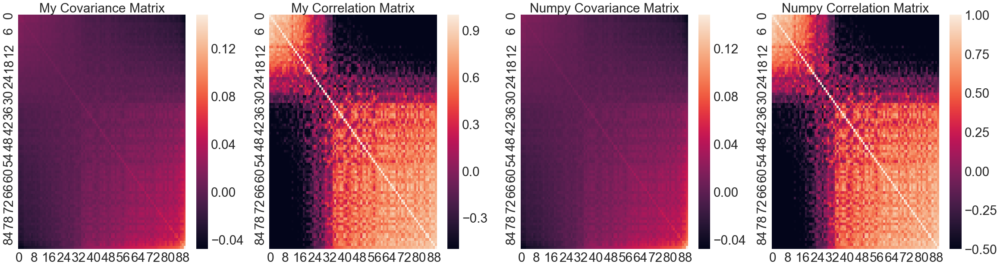

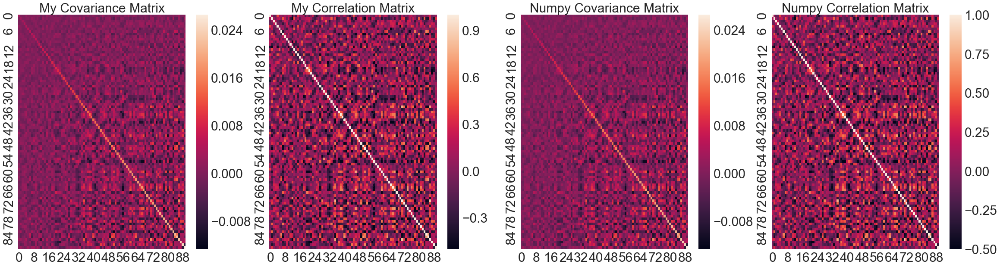

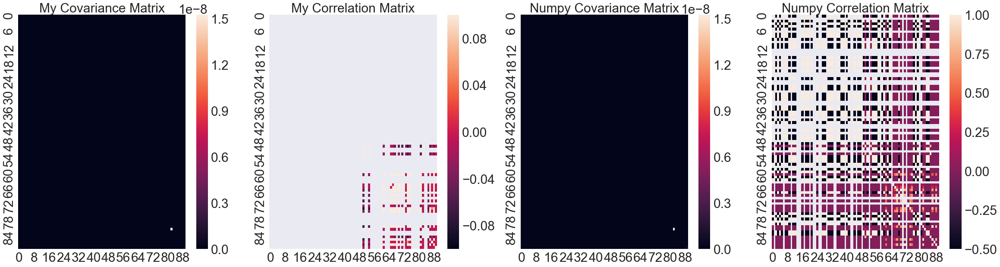

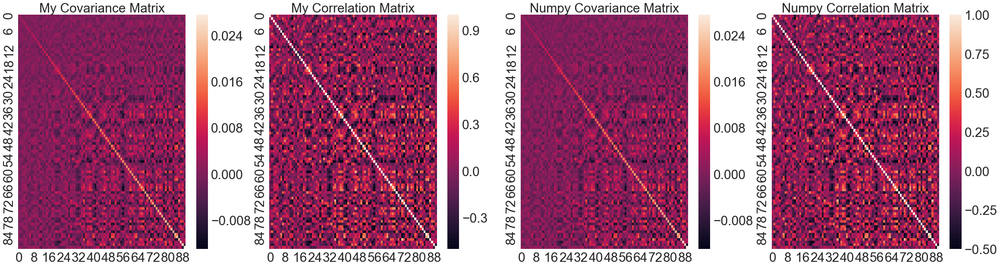

In [0]:
# Sorted View
covariance_mat  = np.cov(all_data_results[:,:,:,:].reshape((90,-1)))
sorted_index    = np.argsort(covariance_mat[np.argmax(covariance_mat.std(0)),:])
sorted_cov    = covariance_mat  [sorted_index]
sorted_image  = all_data_results[sorted_index]
sorted_imagegt= train_data_mini [sorted_index]
showimages (sorted_image  [:,:,:,:],coloums=30,row=3,col=True)
showimages (sorted_image  [:,:,:,0],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,1],coloums=30,row=3,col=False)
showimages (sorted_image  [:,:,:,2],coloums=30,row=3,col=False)
showimages (sorted_imagegt[:,:,:,:],coloums=30,row=3,col=True)
draw_cov_mat(sorted_image)
draw_cov_mat(sorted_image [:,:,:,0]);draw_cov_mat(sorted_image [:,:,:,1]);draw_cov_mat(sorted_image [:,:,:,2])

In [2]:
! start .